## **Restore from Google Drive**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!cp /content/drive/MyDrive/ECE-653/best_traffic_sign_model.pth .

In [3]:
!cp /content/drive/MyDrive/ECE-653/Dataset.zip . && unzip Dataset.zip && rm Dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Dataset/train/00007_00010_00023_png.rf.7835cbcfa6babb68c444a538b0062f17.jpg  
  inflating: Dataset/train/000010_jpg.rf.280eb2d57ed2f197721d34f6ca6c533e.jpg  
  inflating: Dataset/train/00000_00002_00010_png.rf.d57c8945142f6d675990162cdd0dec93.jpg  
  inflating: Dataset/train/000071_jpg.rf.8ebafdeafe82ad824de0313dfde2c888.jpg  
  inflating: Dataset/train/001466_jpg.rf.5f1e09ac149f516e67ac48f70c3b761d.jpg  
  inflating: Dataset/train/00007_00002_00010_png.rf.52a4637f1c61ee211104e9c6d1824d3b.jpg  
  inflating: Dataset/train/road426_png.rf.0cbcc9797ab58af5eefaeb13f28b0c30.jpg  
  inflating: Dataset/train/00000_00005_00002_png.rf.12521c166f3ca192f74ef5a18e5aa2cd.jpg  
  inflating: Dataset/train/001239_jpg.rf.26b4ca5e1f95a67cfe87a10160625899.jpg  
  inflating: Dataset/train/00008_00017_00023_png.rf.4e62fa0b1e9860ed7ef6fcb473637736.jpg  
  inflating: Dataset/train/road371_png.rf.a11017d6c00cd51171d171d53e204235.jpg  
  inflating:

In [4]:
!cp /content/drive/MyDrive/ECE-653/adv_samples.zip . && unzip adv_samples.zip && rm adv_samples.zip

Streaming output truncated to the last 5000 lines.
  inflating: adv_samples/cw/adv_cw_001057_jpg.rf.0d8f858b7a9c12830691348e2ae306af.jpg.png  
  inflating: __MACOSX/adv_samples/cw/._adv_cw_001057_jpg.rf.0d8f858b7a9c12830691348e2ae306af.jpg.png  
  inflating: adv_samples/cw/adv_cw_00002_00015_00028_png.rf.ac59ecad3b803856013c9cf03c12740b.jpg.png  
  inflating: __MACOSX/adv_samples/cw/._adv_cw_00002_00015_00028_png.rf.ac59ecad3b803856013c9cf03c12740b.jpg.png  
  inflating: adv_samples/cw/adv_cw_00004_00051_00023_png.rf.dde86b9f99927dfe07d283b4a78b05b4.jpg.png  
  inflating: __MACOSX/adv_samples/cw/._adv_cw_00004_00051_00023_png.rf.dde86b9f99927dfe07d283b4a78b05b4.jpg.png  
  inflating: adv_samples/cw/adv_cw_00003_00035_00018_png.rf.caf6d26f0e016c573f88c3a3c7312f59.jpg.png  
  inflating: __MACOSX/adv_samples/cw/._adv_cw_00003_00035_00018_png.rf.caf6d26f0e016c573f88c3a3c7312f59.jpg.png  
  inflating: adv_samples/cw/adv_cw_00014_00021_00002_png.rf.bd0269639ea3e797bfa2d7f9c82cc034.jpg.png  


In [5]:
!cp /content/drive/MyDrive/ECE-653/best_filter.npy .

In [6]:
!cp /content/drive/MyDrive/ECE-653/filter_test_dataset.csv .

## **Import packages**

In [7]:
import tensorflow as tf

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.autograd import grad
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from PIL import Image
from IPython.display import display
from google.colab.patches import cv2_imshow
from tqdm import tqdm

import os
import time
import random

## **Set to use CUDA**

In [8]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


## **Class Mapping**

In [9]:

class_to_idx = {
  'Speed Limit 10': 0,
  'Speed Limit 20': 1,
  'Speed Limit 30': 2,
  'Speed Limit 40': 3,
  'Speed Limit 50': 4,
  'Speed Limit 60': 5,
  'Speed Limit 70': 6,
  'Speed Limit 80': 7,
  'Speed Limit 90': 8,
  'Speed Limit 100': 9,
  'Speed Limit 110': 10,
  'Speed Limit 120': 11,
  'Stop': 12
}

class_names = {
    0: 'Speed Limit 10',
    1: 'Speed Limit 20',
    2: 'Speed Limit 30',
    3: 'Speed Limit 40',
    4: 'Speed Limit 50',
    5: 'Speed Limit 60',
    6: 'Speed Limit 70',
    7: 'Speed Limit 80',
    8: 'Speed Limit 90',
    9: 'Speed Limit 100',
    10: 'Speed Limit 110',
    11: 'Speed Limit 120',
    12: 'Stop'
}

## **Define our classifier**

In [10]:
IMAGE_SIZE = 64

class SimpleTrafficSignNet(nn.Module):
    def __init__(self, num_classes=13):
        super(SimpleTrafficSignNet, self).__init__()

        # Layer definitions
        self.conv1 = nn.Conv2d(3, IMAGE_SIZE, kernel_size=5, padding=2)
        self.dropout1 = nn.Dropout(0.1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(IMAGE_SIZE, IMAGE_SIZE*2, kernel_size=5, padding=2)
        self.dropout2 = nn.Dropout(0.2)

        self.conv3 = nn.Conv2d(IMAGE_SIZE*2, IMAGE_SIZE*4, kernel_size=5, padding=2)
        self.dropout3 = nn.Dropout(0.3)

        # This is the key part - we need separate pooling layers with specific sizes
        # to match the Keras model architecture exactly
        self.pool4 = nn.MaxPool2d(kernel_size=8, stride=8)
        self.pool5 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.dropout4 = nn.Dropout(0.5)

        self.fc1 = nn.Linear(28672, 1024)
        self.fc2 = nn.Linear(1024, num_classes)

    def forward(self, x):
        # Conv1 path
        x1 = self.conv1(x)
        x1 = F.relu(x1)
        x1 = self.dropout1(x1)
        x1_pooled = self.pool(x1)

        # Conv2 path
        x2 = self.conv2(x1_pooled)
        x2 = F.relu(x2)
        x2 = self.dropout2(x2)
        x2_pooled = self.pool(x2)

        # Conv3 path
        x3 = self.conv3(x2_pooled)
        x3 = F.relu(x3)
        x3 = self.dropout3(x3)
        x3_pooled = self.pool(x3)

        # Multiscale pooling paths (matching Keras exactly)
        # Path 1: pool4 directly on conv1 output (after dropout)
        path1 = self.pool4(x1)

        # Path 2: pool5 on the output of pool2
        path2 = self.pool5(x2_pooled)

        # Path 3: already at the right size from pool3
        path3 = x3_pooled

        # Flatten and concatenate
        flat1 = torch.flatten(path1, 1)
        flat2 = torch.flatten(path2, 1)
        flat3 = torch.flatten(path3, 1)

        merged = torch.cat([flat1, flat2, flat3], dim=1)

        # Dense layers
        dense1 = self.fc1(merged)
        dense1 = F.relu(dense1)
        dense1 = self.dropout4(dense1)

        # Output layer (logits, no activation)
        output = self.fc2(dense1)         # num_classes

        return output

## **Define Inference**

In [11]:
def infer(model, cv_image):
    # Set model to evaluation mode
    cv2_image_rgb = cv2.cvtColor(cv_image, cv2.COLOR_BGR2RGB)
    image = Image.fromarray(cv2_image_rgb)
    transform = transforms.ToTensor()

    image_tensor = transform(image)
    image_tensor = image_tensor.permute(1, 2, 0)

    image_tensor = image_tensor.to(device)
    model = model.to(device)

    return predict(model, image_tensor)

# This predict function will be also used by adversarial attacks!
def predict(model, x_in):
    device = next(model.parameters()).device
    model.eval()

    with torch.no_grad():
        # Get current image dimensions
        h, w, c = x_in.shape

        # Convert numpy to tensor and add batch dimension
        x_tensor = x_in.clone().detach().permute(2, 0, 1).unsqueeze(0).to(device)
        #x_tensor = torch.tensor(x_in, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0).to(device)

        if torch.any(x_tensor > 1.0):
            x_tensor = x_tensor / 255.0

        # Resize to model input size if needed
        if h != IMAGE_SIZE or w != IMAGE_SIZE:
            x_tensor = F.interpolate(x_tensor, size=(IMAGE_SIZE, IMAGE_SIZE), mode='bilinear', align_corners=False)

        outputs = model(x_tensor)

        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        prediction = outputs.argmax(dim=1).cpu().numpy()[0]


    return prediction, probabilities.squeeze().cpu().numpy()

def predict_class_only(model, x_in):
    prediction, _ = predict(model, x_in)
    return prediction

# Function to display prediction results
def display_prediction(predicted_class, probabilities):
    """
    Display the prediction results

    Args:
        predicted_class: Index of the predicted class
        probabilities: Probabilities for each class
    """
    print(f"Predicted class: {class_names[predicted_class]}")
    print(f"Confidence: {probabilities[predicted_class]*100:.2f}%")

    # Display top 3 predictions
    top3_indices = np.argsort(probabilities)[-3:][::-1]

    plt.figure(figsize=(10, 5))
    plt.barh([class_names[i] for i in top3_indices],
             [probabilities[i] for i in top3_indices])
    plt.xlabel('Probability')
    plt.title('Top 3 Predictions')
    plt.tight_layout()
    plt.show()

def perform_inference(model, cv_image, should_crop=False, display_pred=False):
    if should_crop:
      cv_image = crop_with_custom_model_cv2(cv_image)
      if cv_image is None:
          print("Nothing detected.")
          return None, None

    # Perform inference
    predicted_class, probabilities = infer(model, cv_image)

    if display_pred:
      display_prediction(predicted_class, probabilities)

    return predicted_class, probabilities

## **Load Model**

In [12]:
def load_model(model_path, num_classes=13):
    model = SimpleTrafficSignNet(num_classes=num_classes)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    return model

model = load_model('best_traffic_sign_model.pth')

## Create annotation file again... It is kind of messed up

In [ ]:
ADV_SAMPLES_PATH = os.path.join('adv_samples')
ANNOTATIONS_CSV_PATH = os.path.join(ADV_SAMPLES_PATH, '_annotations.csv')

df = {}
df['train'] = pd.read_csv(os.path.join('Dataset', 'train', '_annotations.csv'), header=None)
df['test'] = pd.read_csv(os.path.join('Dataset', 'test', '_annotations.csv'), header=None)
df['valid'] = pd.read_csv(os.path.join('Dataset', 'valid', '_annotations.csv'), header=None)


with open(ANNOTATIONS_CSV_PATH, "w") as file:
    file.write('ORIGINAL_FILEPATH,ADV_FILEPATH,ATTACK_TYPE,GROUND_TRUTH_LABEL,TARGETTED_CLASS_LABEL,ORIG_PREDICTED_LABEL,ORIG_PREDICTED_PROB,ADV_PREDICTED_LABEL,ADV_PREDICTED_PROB,ADV_TO_BE_RECOVERED_LABEL_PROB\n')

l1 = os.listdir(os.path.join(ADV_SAMPLES_PATH, 'cjsma'))
l2 = os.listdir(os.path.join(ADV_SAMPLES_PATH, 'cw'))
l3 = os.listdir(os.path.join(ADV_SAMPLES_PATH, 'fg'))
l4 = os.listdir(os.path.join(ADV_SAMPLES_PATH, 'iterative'))
l5 = os.listdir(os.path.join(ADV_SAMPLES_PATH, 'jsma'))
l6 = os.listdir(os.path.join(ADV_SAMPLES_PATH, 'spgd'))

lists = l1 + l2 + l3 + l4 + l5 + l6

i = 1
for adv_filename in lists:
  original_filename = "_".join(adv_filename[4:-4].split('_')[1:])

  original_filepath = None
  dataset = None

  check1 = os.path.isfile(os.path.join('Dataset', 'train', original_filename))
  check2 = os.path.isfile(os.path.join('Dataset', 'test', original_filename))
  check3 = os.path.isfile(os.path.join('Dataset', 'valid', original_filename))

  if check1:
    dataset = 'train'
  elif check2:
    dataset = 'test'
  elif check3:
    dataset = 'valid'
  else:
    print("Not found")
    continue

  original_filepath = os.path.join('Dataset', dataset, original_filename)
  attack_type = adv_filename.split('_')[1]
  adv_filepath = os.path.join(ADV_SAMPLES_PATH, attack_type, adv_filename)

  df_now = df[dataset]

  row = df_now[df_now[0].str.contains(original_filename)]
  ground_truth_label = class_to_idx[row[3].values[0]]
  targeted_class_label = 10

  orig_pred_label, orig_prob = infer(model, cv2.imread(original_filepath))
  orig_pred_prob = orig_prob[orig_pred_label]

  adv_pred_label, adv_prob = infer(model, cv2.imread(adv_filepath))
  adv_pred_prob = adv_prob[adv_pred_label]

  adv_to_be_recovered_label_prob = adv_prob[orig_pred_label]

  print(f'{i}/{len(lists)}')
  i += 1
  with open(ANNOTATIONS_CSV_PATH, "a") as file:
    file.write(f'{original_filepath},{adv_filepath},{attack_type},{ground_truth_label},{targeted_class_label},{orig_pred_label},{orig_pred_prob},{adv_pred_label},{adv_pred_prob},{adv_to_be_recovered_label_prob}\n')


Streaming output truncated to the last 5000 lines.
284/5283
285/5283
286/5283
287/5283
288/5283
289/5283
290/5283
291/5283
292/5283
293/5283
294/5283
295/5283
296/5283
297/5283
298/5283
299/5283
300/5283
301/5283
302/5283
303/5283
304/5283
305/5283
306/5283
307/5283
308/5283
309/5283
310/5283
311/5283
312/5283
313/5283
314/5283
315/5283
316/5283
317/5283
318/5283
319/5283
320/5283
321/5283
322/5283
323/5283
324/5283
325/5283
326/5283
327/5283
328/5283
329/5283
330/5283
331/5283
332/5283
333/5283
334/5283
335/5283
336/5283
337/5283
338/5283
339/5283
340/5283
341/5283
342/5283
343/5283
344/5283
345/5283
346/5283
347/5283
348/5283
349/5283
350/5283
351/5283
352/5283
353/5283
354/5283
355/5283
356/5283
357/5283
358/5283
359/5283
360/5283
361/5283
362/5283
363/5283
364/5283
365/5283
366/5283
367/5283
368/5283
369/5283
370/5283
371/5283
372/5283
373/5283
374/5283
375/5283
376/5283
377/5283
378/5283
379/5283
380/5283
381/5283
382/5283
383/5283
384/5283
385/5283
386/5283
387/5283
388/5283
389/

## Backup

In [ ]:
!zip -r adv_samples.zip adv_samples/
!cp -f adv_samples.zip /content/drive/MyDrive/ECE-653/

## **Define Paths**

In [23]:
ADV_SAMPLES_PATH = os.path.join('adv_samples')
ANNOTATIONS_CSV_PATH = os.path.join(ADV_SAMPLES_PATH, '_annotations.csv')
#ANNOTATIONS_CSV_PATH = 'filter_test_dataset.csv'

## **Define BGR2RGB**

In [14]:
def rgb(cv_image):
  return cv2.cvtColor(cv_image, cv2.COLOR_BGR2RGB)

## **Select Sample**

In [28]:
df = pd.read_csv(ANNOTATIONS_CSV_PATH, header=0)

selected_samples = []

### Clustered JSMA
mask = df['ATTACK_TYPE'].str.contains('cjsma')
samples = df[mask].sort_values(by=['ORIGINAL_FILEPATH'])
selected_samples.append(samples.iloc[300])
selected_samples.append(samples.iloc[310])
selected_samples.append(samples.iloc[320])
selected_samples.append(samples.iloc[330])
selected_samples.append(samples.iloc[340])

mask = df['ATTACK_TYPE'].str.contains('cw')
samples = df[mask].sort_values(by=['ORIGINAL_FILEPATH'])
selected_samples.append(samples.iloc[300])
selected_samples.append(samples.iloc[310])
selected_samples.append(samples.iloc[320])
selected_samples.append(samples.iloc[330])
selected_samples.append(samples.iloc[340])

mask = df['ATTACK_TYPE'].str.contains('spgd')
samples = df[mask].sort_values(by=['ORIGINAL_FILEPATH'])
selected_samples.append(samples.iloc[300])
selected_samples.append(samples.iloc[310])
selected_samples.append(samples.iloc[320])
selected_samples.append(samples.iloc[330])
selected_samples.append(samples.iloc[340])


"""
### Carlini & Wagner
mask = df['ATTACK_TYPE'].str.contains('cw')
samples = df[mask].sort_values(by=['ORIGINAL_FILEPATH'])
selected_samples.append(samples.iloc[93])
selected_samples.append(samples.iloc[261])
"""

#for sample in selected_samples:
#  cv2_imshow(cv2.imread(sample.iloc[1]))


"\n### Carlini & Wagner\nmask = df['ATTACK_TYPE'].str.contains('cw')\nsamples = df[mask].sort_values(by=['ORIGINAL_FILEPATH'])\nselected_samples.append(samples.iloc[93])\nselected_samples.append(samples.iloc[261])\n"

## **Display Intuitive Way Result**

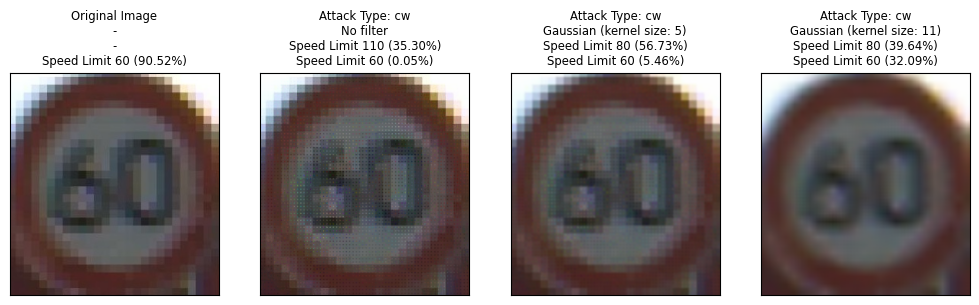

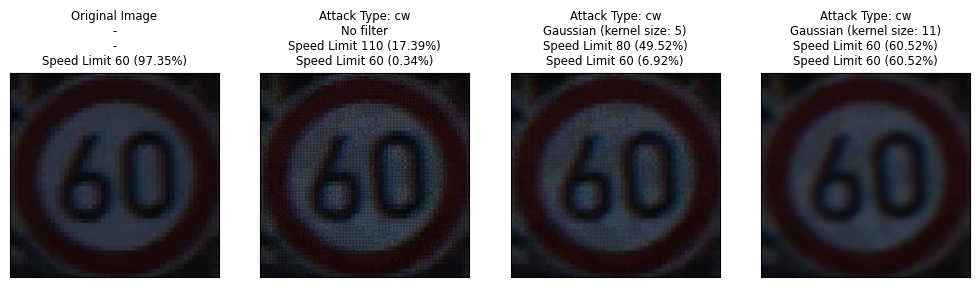

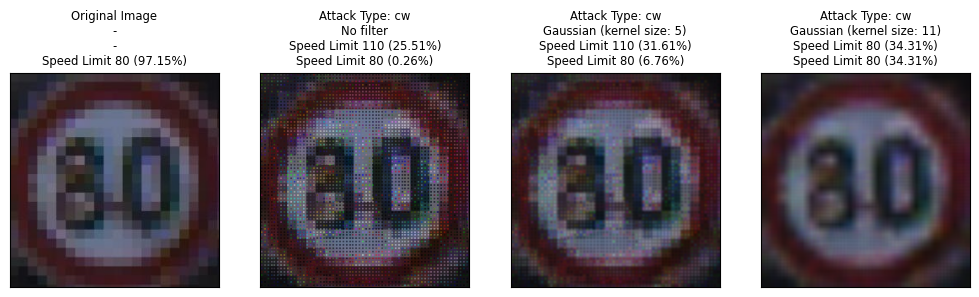

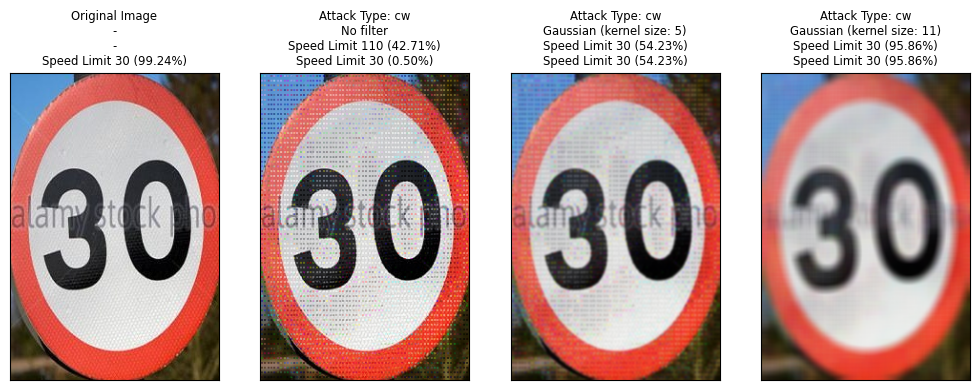

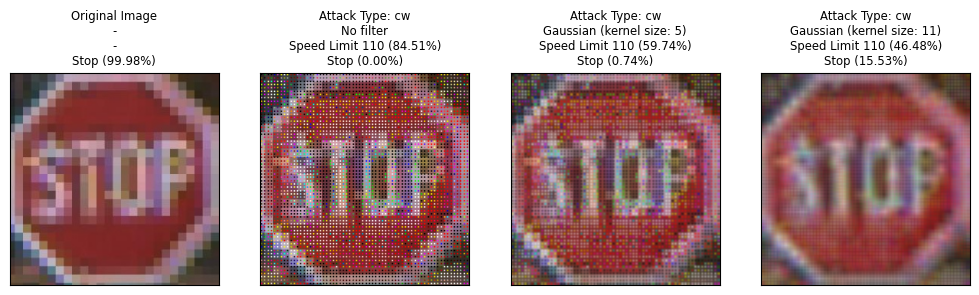

In [18]:
plt.rcParams.update({'font.size': 7})

for sample in selected_samples:
    sample_orig_path = sample.iloc[0]
    sample_attack_type = sample.iloc[2]
    sample_orig_cv2_image = cv2.imread(sample_orig_path)
    sample_orig_pred_label = sample.iloc[5]
    sample_orig_pred_prob = sample.iloc[6]
    sample_path = sample.iloc[1]
    sample_cv2_image = cv2.imread(sample_path)


    sample_blurred_image_1 = cv2.GaussianBlur(sample_cv2_image, (5, 5), 0)
    sample_blurred_pred_label_1, sample1_blurred_prob_1 = infer(model, sample_blurred_image_1)
    sample_blurred_image_2 = cv2.GaussianBlur(sample_cv2_image, (11, 11), 10)
    sample_blurred_pred_label_2, sample1_blurred_prob_2 = infer(model, sample_blurred_image_2)

    fig, axes = plt.subplots(1, 4)  # 1 rows, 2 columns
    axes = axes.flatten()
    for i, ax in enumerate(axes):
      ax.set_xticks([])  # Remove x-axis ticks
      ax.set_yticks([])  # Remove y-axis ticks

    # Display each image in a subplot
    axes[0].imshow(rgb(sample_orig_cv2_image))
    axes[0].set_title(f'Original Image\n-\n-\n{class_names[sample_orig_pred_label]} ({sample_orig_pred_prob * 100:.2f}%)')

    axes[1].imshow(rgb(sample_cv2_image))
    axes[1].set_title(f'Attack Type: {sample_attack_type}\nNo filter\n{class_names[sample.iloc[7]]} ({sample.iloc[8] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample.iloc[9] * 100:.2f}%)')

    axes[2].imshow(rgb(sample_blurred_image_1))
    axes[2].set_title(f'Attack Type: {sample_attack_type}\nGaussian (kernel size: 5)\n{class_names[sample_blurred_pred_label_1]} ({sample1_blurred_prob_1[sample_blurred_pred_label_1] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample1_blurred_prob_1[sample_orig_pred_label] * 100:.2f}%)')

    axes[3].imshow(rgb(sample_blurred_image_2))
    axes[3].set_title(f'Attack Type: {sample_attack_type}\nGaussian (kernel size: 11)\n{class_names[sample_blurred_pred_label_2]} ({sample1_blurred_prob_2[sample_blurred_pred_label_2] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample1_blurred_prob_2[sample_orig_pred_label] * 100:.2f}%)')


    plt.subplots_adjust(left=0.0, right=1.5, top=1.5, bottom=0)

    plt.show()

## **<font color="red">Define Custom Kernel (WE WILL TRAIN THIS!)</font>**

In [ ]:

custom_trainable_kernel_1 = np.array([
    [0.075, 0.124, 0.075],
    [0.124, 0.204, 0.124],
    [0.075, 0.124, 0.075]
], dtype=np.float32)

custom_trainable_kernel_2 = np.array([
    [0.000, 0.000, 0.002, 0.002, 0.002, 0.000, 0.000],
    [0.000, 0.008, 0.020, 0.026, 0.020, 0.008, 0.000],
    [0.002, 0.020, 0.047, 0.062, 0.047, 0.020, 0.002],
    [0.002, 0.026, 0.062, 0.082, 0.062, 0.026, 0.002],
    [0.002, 0.020, 0.047, 0.062, 0.047, 0.020, 0.002],
    [0.000, 0.008, 0.020, 0.026, 0.020, 0.008, 0.000],
    [0.000, 0.000, 0.002, 0.002, 0.002, 0.000, 0.000]
], dtype=np.float32)

## **Display Custom Custom Kernel Applied Result**

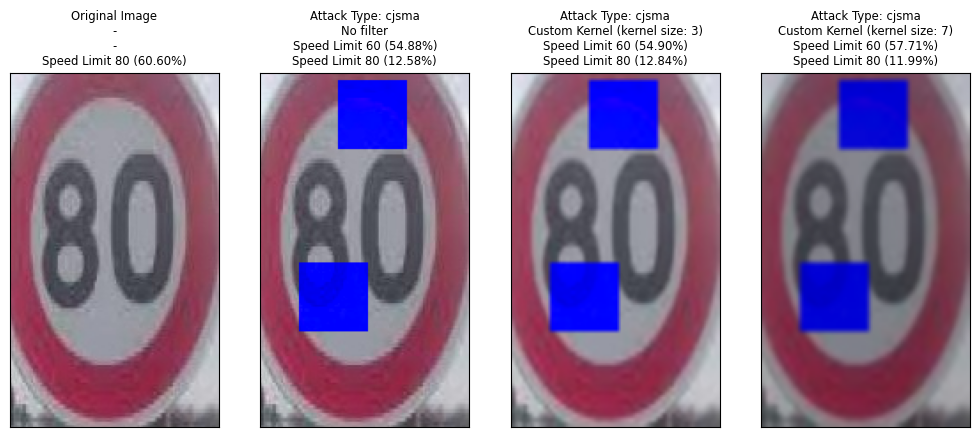

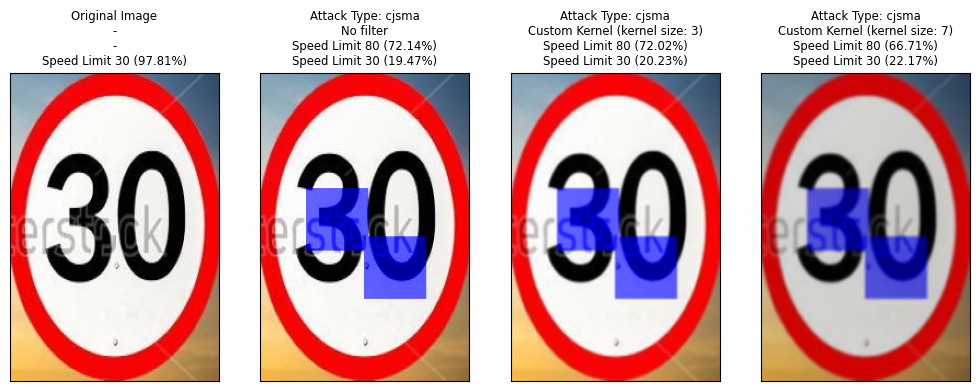

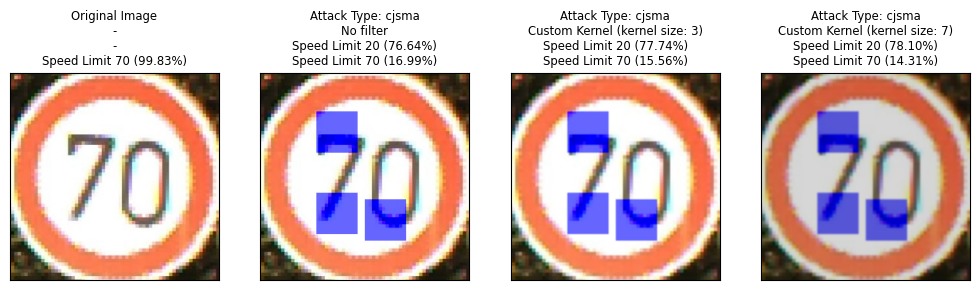

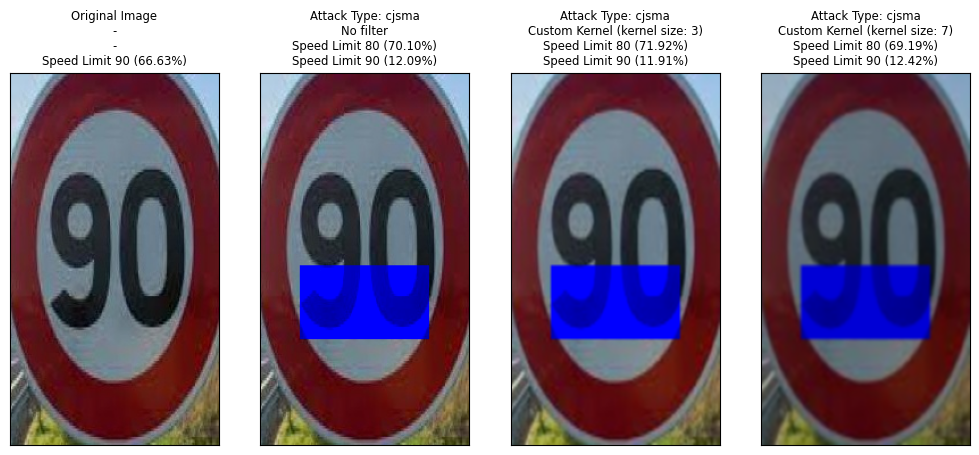

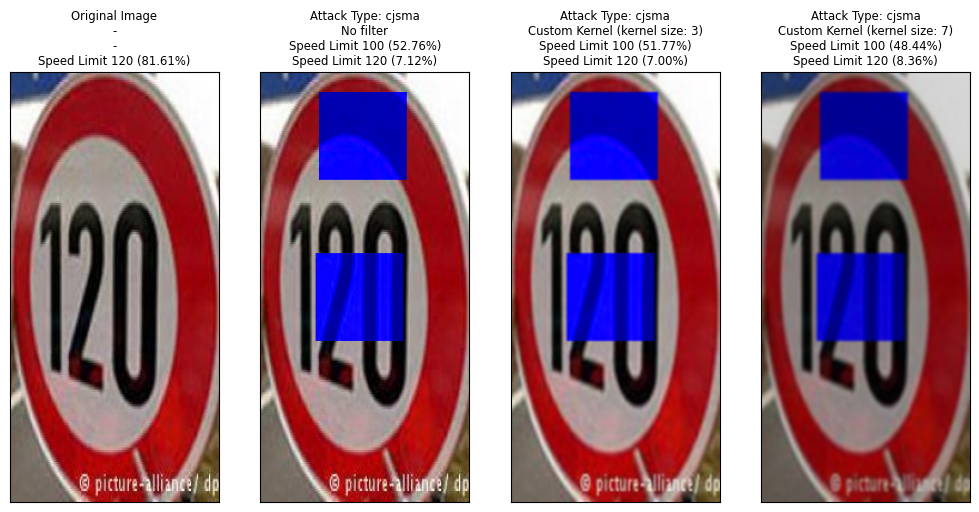

In [ ]:
for sample in selected_samples:
    sample_orig_path = sample.iloc[0]
    sample_attack_type = sample.iloc[2]
    sample_orig_cv2_image = cv2.imread(sample_orig_path)
    sample_orig_pred_label = sample.iloc[5]
    sample_orig_pred_prob = sample.iloc[6]
    sample_path = sample.iloc[1]
    sample_cv2_image = cv2.imread(sample_path)

    fig, axes = plt.subplots(1, 4)
    axes = axes.flatten()
    for i, ax in enumerate(axes):
      ax.set_xticks([])  # Remove x-axis ticks
      ax.set_yticks([])  # Remove y-axis ticks

    cv2_custom_kernel1_image = cv2.filter2D(sample_cv2_image, -1, custom_trainable_kernel_1)
    cv2_custom_kernel2_image = cv2.filter2D(sample_cv2_image, -1, custom_trainable_kernel_2)

    ck1_pred_label, ck1_prob = infer(model, cv2_custom_kernel1_image)
    ck2_pred_label, ck2_prob = infer(model, cv2_custom_kernel2_image)

    # Display each image in a subplot
    axes[0].imshow(rgb(sample_orig_cv2_image))
    axes[0].set_title(f'Original Image\n-\n-\n{class_names[sample.iloc[5]]} ({sample.iloc[6] * 100:.2f}%)')

    axes[1].imshow(rgb(sample_cv2_image))
    axes[1].set_title(f'Attack Type: {sample.iloc[2]}\nNo filter\n{class_names[sample.iloc[7]]} ({sample.iloc[8] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample.iloc[9] * 100:.2f}%)')

    axes[2].imshow(rgb(cv2_custom_kernel1_image))
    axes[2].set_title(f'Attack Type: {sample.iloc[2]}\nCustom Kernel (kernel size: 3)\n{class_names[ck1_pred_label]} ({ck1_prob[ck1_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({ck1_prob[sample_orig_pred_label] * 100:.2f}%)')

    axes[3].imshow(rgb(cv2_custom_kernel2_image))
    axes[3].set_title(f'Attack Type: {sample.iloc[2]}\nCustom Kernel (kernel size: 7)\n{class_names[ck2_pred_label]} ({ck2_prob[ck2_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({ck2_prob[sample_orig_pred_label] * 100:.2f}%)')

    plt.subplots_adjust(left=0.0, right=1.5, top=1.5, bottom=0)
    plt.show()

## Paper-suggested method description

Based on the paper "An Efficient Pre-processing Method to Eliminate Adversarial Effects" by Wang, Wang, and Yin, we can summarize the traditional and suggested preprocessing approaches for defending against adversarial examples. <br/><br/>

**Traditional Preprocessing Methods**<br/>
The paper discusses several traditional defense methods against adversarial attacks:<br/><br/>

JPEG Compression: The paper acknowledges JPEG compression as "an effective way to defend adversarial examples" (page 3). However, it points out that JPEG compression has limitations - at medium and low bitrates, it produces blocking artifacts that reduce image quality and classification accuracy.<br/><br/>
PixelDefend: Which transforms perturbed images into clean images
Random transformations: Adding randomized resizing and padding layers<br/><br/>
High-level representation guided denoiser (HGD)
Comdefend: Using convolutional neural networks to compress and reconstruct images<br/><br/>

-------------------------
<br/>

**Proposed Preprocessing Method**<br/>
The authors propose a new efficient preprocessing method that combines two simple image transformations:<br/><br/>

WebP Compression: Instead of JPEG, they use WebP lossy compression which:<br/>

> 1) Is designed to remove image details difficult for humans to perceive<br/><br/>
> 2) Introduces loop filtering that eliminates blocking artifacts
Maintains higher image quality while effectively removing imperceptible adversarial perturbations<br/><br/>


Flip Operation: After compression, they flip the image once along one side (specifically using Image.FLIP_LEFT_RIGHT)<br/><br/>

This only changes pixel positions without changing pixel values
Destroys the specific structure of adversarial perturbations
Changes how the adversarial noise affects the activation function<br/><br/>

-----------------------
<br/>

The paper shows that this combination of WebP compression and flipping provides superior defense against various adversarial attacks (IFGSM, DeepFool, and C&W_L2) while maintaining high accuracy on benign images. Their method outperformed state-of-the-art defense methods like Comdefend and JPEG compression, with their top-1 accuracy being more than 20% higher than Comdefend and 5% higher than JPEG compression.<br/><br/>

The key advantage of their approach is that it's simple, efficient, and doesn't require changing the structure of the neural network or retraining the model.

## **Apply paper-suggested method**

>
Flipping the image does not make any sense in this particular scenario.<br/>
So, if we don't train the model with flipped image, flipped image will of course fool the model. <br/>
But since flipping the traffic sign will never happen in real-world ...

Anyhow... I trained the classifier again with flipped images as well.

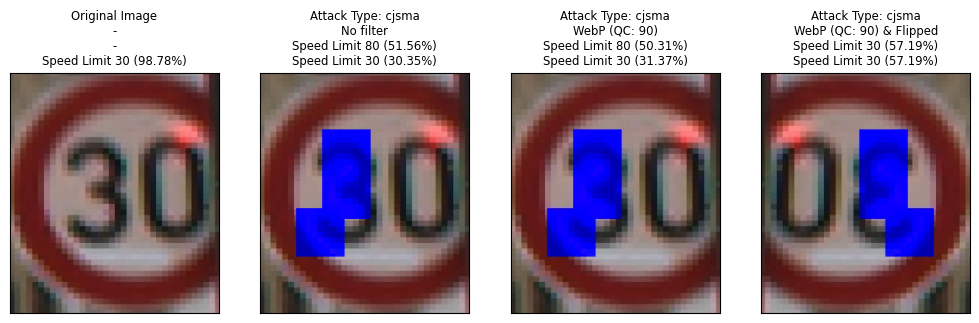

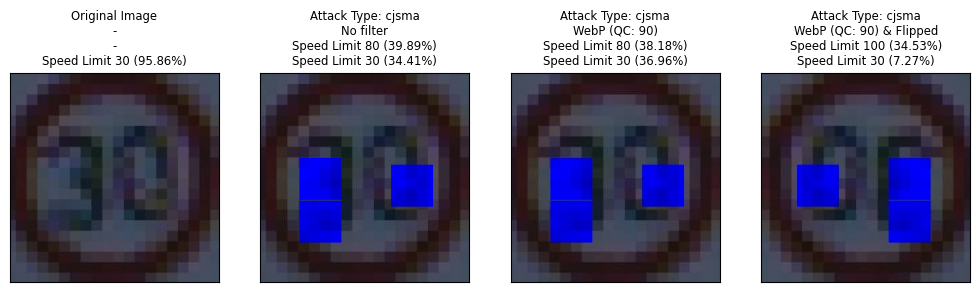

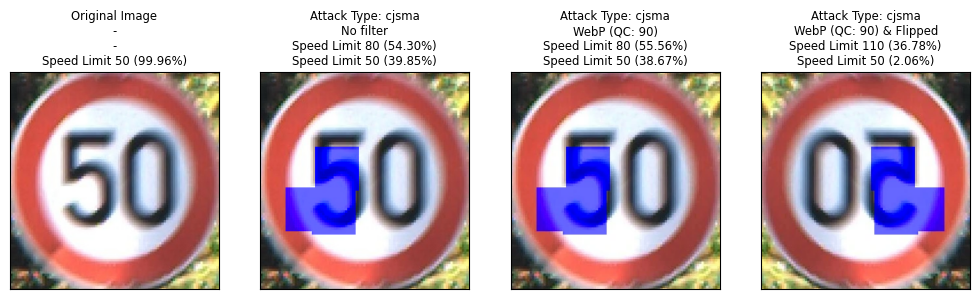

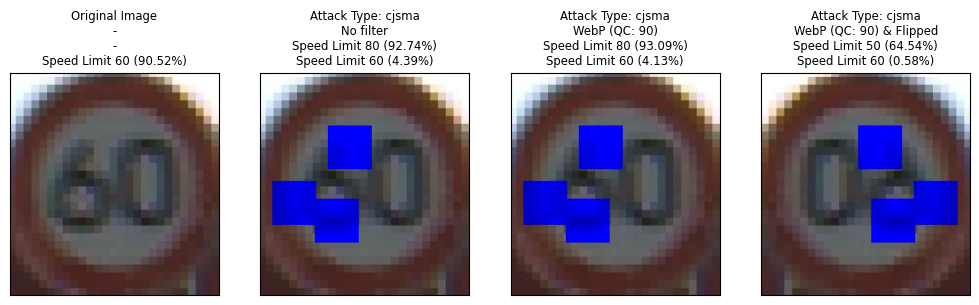

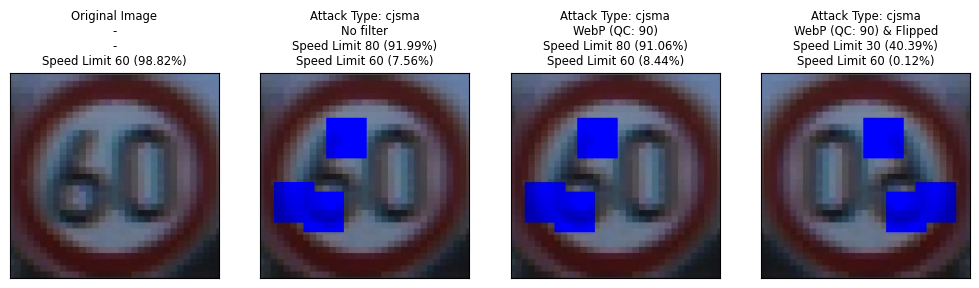

In [25]:
QUALITY = 90

for sample in selected_samples:
    sample_orig_path = sample.iloc[0]
    sample_attack_type = sample.iloc[2]
    sample_orig_cv2_image = cv2.imread(sample_orig_path)
    sample_orig_pred_label = sample.iloc[5]
    sample_orig_pred_prob = sample.iloc[6]
    sample_path = sample.iloc[1]
    sample_cv2_image = cv2.imread(sample_path)

    cv2.imwrite('temp1.webp', sample_cv2_image, [cv2.IMWRITE_WEBP_QUALITY, QUALITY])
    sample_webp_cv2_image = cv2.imread('temp1.webp')
    sample_webp_pred_label, sample_webp_prob = infer(model, sample_webp_cv2_image)
    sample_flipped_cv2_image = cv2.flip(sample_webp_cv2_image, 1)
    sample_flipped_pred_label, sample_flipped_prob = infer(model, sample_flipped_cv2_image)

    fig, axes = plt.subplots(1, 4)  # 2 rows, 2 columns
    axes = axes.flatten()
    for i, ax in enumerate(axes):
      ax.set_xticks([])  # Remove x-axis ticks
      ax.set_yticks([])  # Remove y-axis ticks

    # Display each image in a subplot
    axes[0].imshow(rgb(sample_orig_cv2_image))
    axes[0].set_title(f'Original Image\n-\n-\n{class_names[sample.iloc[5]]} ({sample.iloc[6] * 100:.2f}%)')

    axes[1].imshow(rgb(sample_cv2_image))
    axes[1].set_title(f'Attack Type: {sample.iloc[2]}\nNo filter\n{class_names[sample.iloc[7]]} ({sample.iloc[8] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample.iloc[9] * 100:.2f}%)')

    axes[2].imshow(rgb(sample_webp_cv2_image))
    axes[2].set_title(f'Attack Type: {sample.iloc[2]}\nWebP (QC: {QUALITY})\n{class_names[sample_webp_pred_label]} ({sample_webp_prob[sample_webp_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample_webp_prob[sample_orig_pred_label] * 100:.2f}%)')

    axes[3].imshow(rgb(sample_flipped_cv2_image))
    axes[3].set_title(f'Attack Type: {sample.iloc[2]}\nWebP (QC: {QUALITY}) & Flipped\n{class_names[sample_flipped_pred_label]} ({sample_flipped_prob[sample_flipped_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample_flipped_prob[sample_orig_pred_label] * 100:.2f}%)')

    plt.subplots_adjust(left=0.0, right=1.5, top=1.5, bottom=0)
    plt.show()

## **Apply Our Filter**

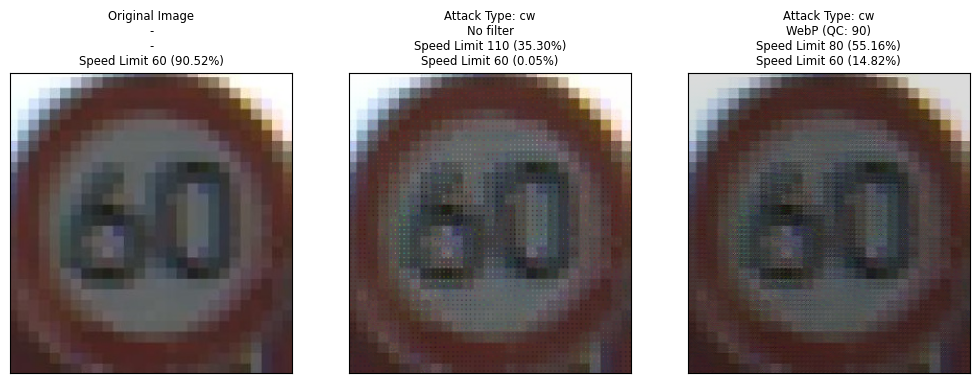

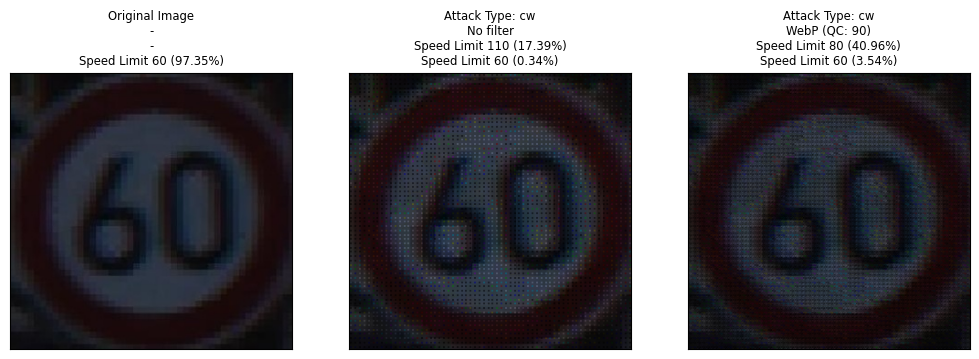

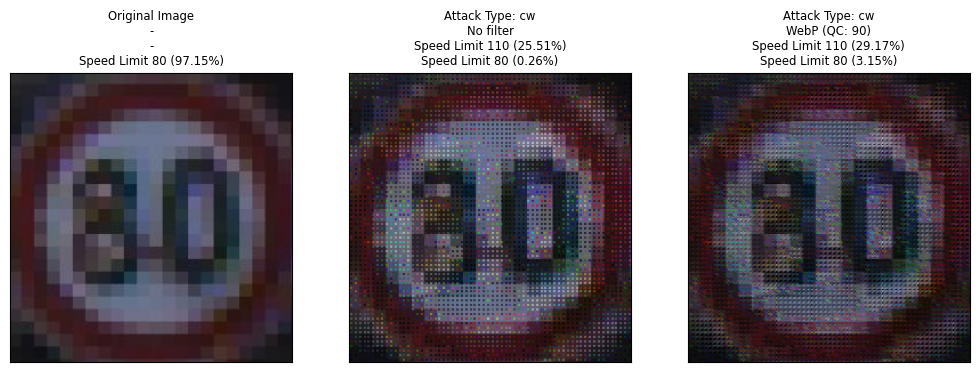

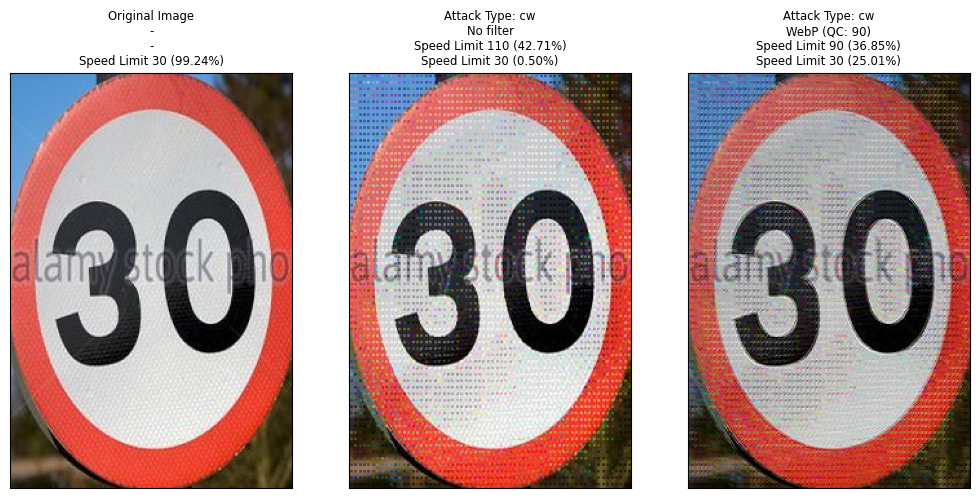

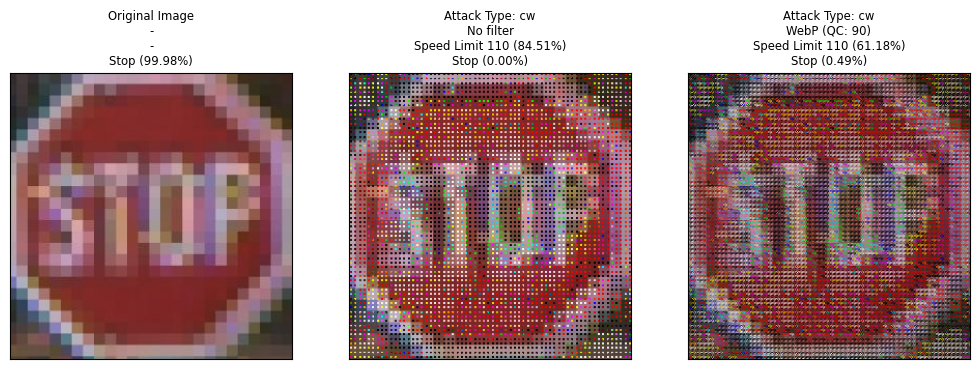

In [20]:
filter = np.load('best_filter.npy')

for sample in selected_samples:
    sample_orig_path = sample.iloc[0]
    sample_attack_type = sample.iloc[2]
    sample_orig_cv2_image = cv2.imread(sample_orig_path)
    sample_orig_pred_label = sample.iloc[5]
    sample_orig_pred_prob = sample.iloc[6]
    sample_path = sample.iloc[1]
    sample_cv2_image = cv2.imread(sample_path)

    sample_our_filter_cv2_image = cv2.filter2D(sample_cv2_image, -1, filter)
    sample_our_filter_pred_label, sample_our_filter_prob = infer(model, sample_our_filter_cv2_image)

    fig, axes = plt.subplots(1, 3)  # 2 rows, 2 columns
    axes = axes.flatten()
    for i, ax in enumerate(axes):
      ax.set_xticks([])  # Remove x-axis ticks
      ax.set_yticks([])  # Remove y-axis ticks

    # Display each image in a subplot
    axes[0].imshow(rgb(sample_orig_cv2_image))
    axes[0].set_title(f'Original Image\n-\n-\n{class_names[sample.iloc[5]]} ({sample.iloc[6] * 100:.2f}%)')

    axes[1].imshow(rgb(sample_cv2_image))
    axes[1].set_title(f'Attack Type: {sample.iloc[2]}\nNo filter\n{class_names[sample.iloc[7]]} ({sample.iloc[8] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample.iloc[9] * 100:.2f}%)')

    axes[2].imshow(rgb(sample_our_filter_cv2_image))
    axes[2].set_title(f'Attack Type: {sample.iloc[2]}\nWebP (QC: {QUALITY})\n{class_names[sample_our_filter_pred_label]} ({sample_our_filter_prob[sample_our_filter_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample_our_filter_prob[sample_orig_pred_label] * 100:.2f}%)')

    plt.subplots_adjust(left=0.0, right=1.5, top=1.5, bottom=0)
    plt.show()

## **Compare Results**

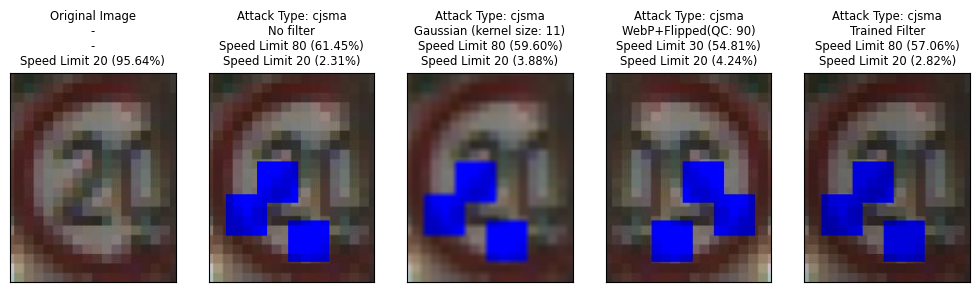

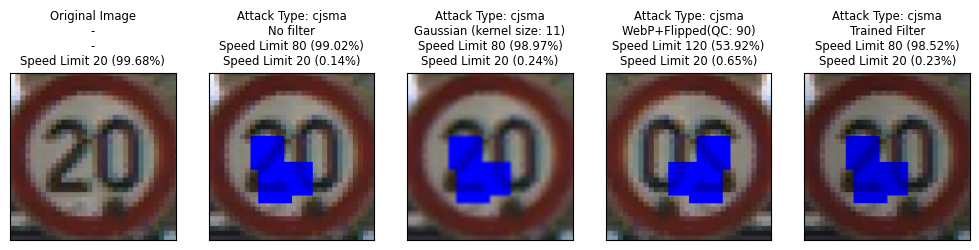

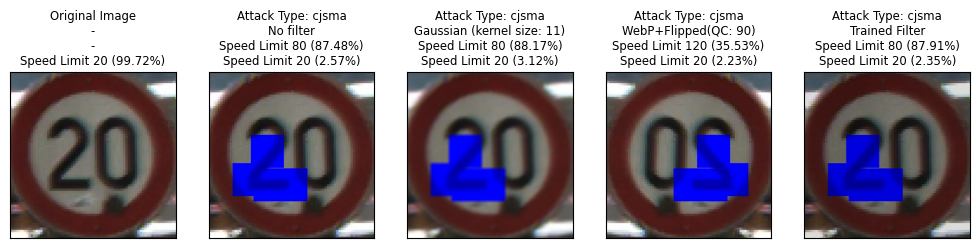

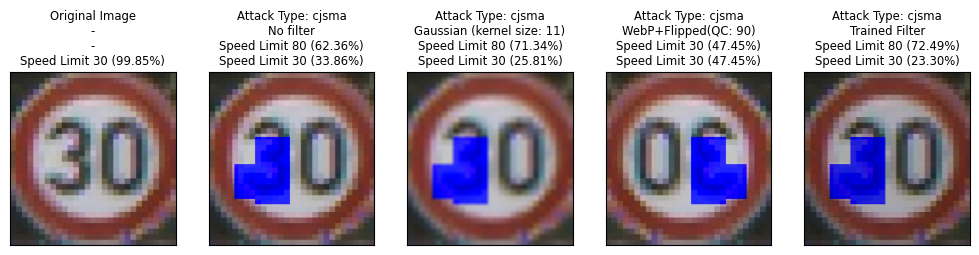

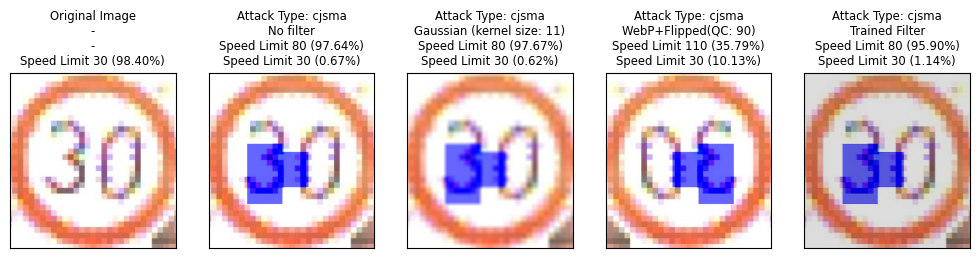

...

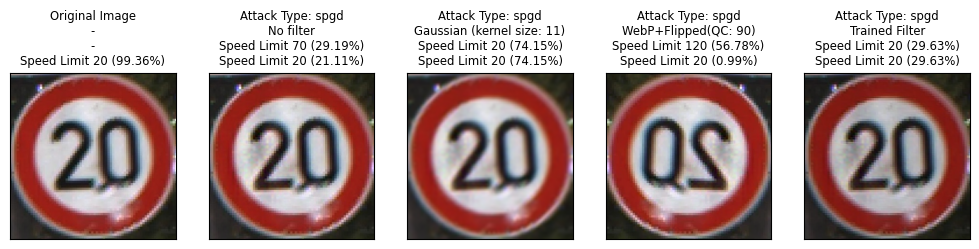

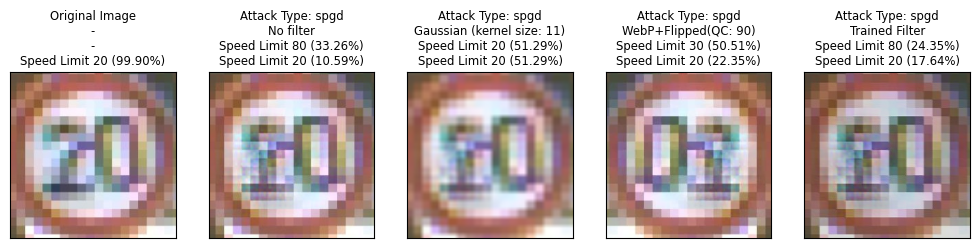

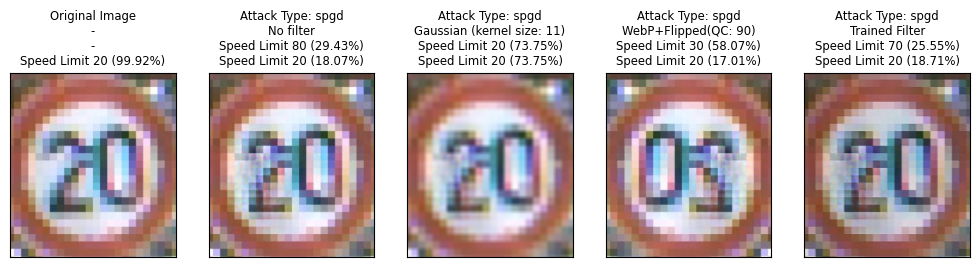

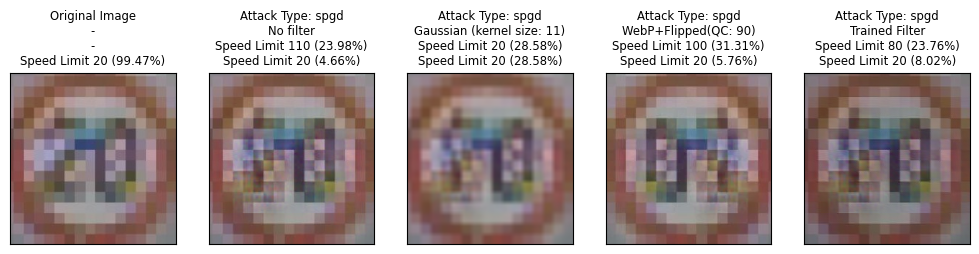

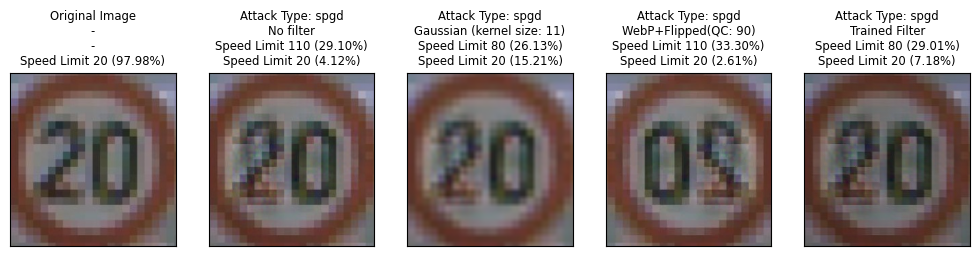

In [29]:
for sample in selected_samples:
    sample_orig_path = sample.iloc[0]
    sample_attack_type = sample.iloc[2]
    sample_orig_cv2_image = cv2.imread(sample_orig_path)
    sample_orig_pred_label = sample.iloc[5]
    sample_orig_pred_prob = sample.iloc[6]
    sample_path = sample.iloc[1]
    sample_cv2_image = cv2.imread(sample_path)

    sample_blurred_cv2_image = cv2.GaussianBlur(sample_cv2_image, (7, 7), 5)
    sample_blurred_pred_label, sample_blurred_prob = infer(model, sample_blurred_cv2_image)

    cv2.imwrite('temp1.webp', sample_cv2_image, [cv2.IMWRITE_WEBP_QUALITY, QUALITY])
    sample_webp_cv2_image = cv2.imread('temp1.webp')
    sample_webp_pred_label, sample_webp_prob = infer(model, sample_webp_cv2_image)
    sample_flipped_cv2_image = cv2.flip(sample_webp_cv2_image, 1)
    sample_flipped_pred_label, sample_flipped_prob = infer(model, sample_flipped_cv2_image)

    sample_our_filter_cv2_image = cv2.filter2D(sample_cv2_image, -1, filter)
    sample_our_filter_pred_label, sample_our_filter_prob = infer(model, sample_our_filter_cv2_image)

    fig, axes = plt.subplots(1, 5)  # 2 rows, 2 columns
    axes = axes.flatten()
    for i, ax in enumerate(axes):
      ax.set_xticks([])  # Remove x-axis ticks
      ax.set_yticks([])  # Remove y-axis ticks

    # Display each image in a subplot
    axes[0].imshow(rgb(sample_orig_cv2_image))
    axes[0].set_title(f'Original Image\n-\n-\n{class_names[sample.iloc[5]]} ({sample.iloc[6] * 100:.2f}%)')

    axes[1].imshow(rgb(sample_cv2_image))
    axes[1].set_title(f'Attack Type: {sample.iloc[2]}\nNo filter\n{class_names[sample.iloc[7]]} ({sample.iloc[8] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample.iloc[9] * 100:.2f}%)')

    axes[2].imshow(rgb(sample_blurred_cv2_image))
    axes[2].set_title(f'Attack Type: {sample_attack_type}\nGaussian (kernel size: 11)\n{class_names[sample_blurred_pred_label]} ({sample_blurred_prob[sample_blurred_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample_blurred_prob[sample_orig_pred_label] * 100:.2f}%)')

    #axes[3].imshow(rgb(sample_webp_cv2_image))
    #axes[3].set_title(f'Attack Type: {sample.iloc[2]}\nWebP (QC: {QUALITY})\n{class_names[sample_webp_pred_label]} ({sample_webp_prob[sample_webp_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample_webp_prob[sample_orig_pred_label] * 100:.2f}%)')
    axes[3].imshow(rgb(sample_flipped_cv2_image))
    axes[3].set_title(f'Attack Type: {sample.iloc[2]}\nWebP+Flipped(QC: {QUALITY})\n{class_names[sample_flipped_pred_label]} ({sample_flipped_prob[sample_flipped_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample_flipped_prob[sample_orig_pred_label] * 100:.2f}%)')

    axes[4].imshow(rgb(sample_our_filter_cv2_image))
    axes[4].set_title(f'Attack Type: {sample.iloc[2]}\nTrained Filter\n{class_names[sample_our_filter_pred_label]} ({sample_our_filter_prob[sample_our_filter_pred_label] * 100:.2f}%)\n{class_names[sample_orig_pred_label]} ({sample_our_filter_prob[sample_orig_pred_label] * 100:.2f}%)')

    plt.subplots_adjust(left=0.0, right=1.5, top=1.5, bottom=0)
    plt.show()